# EDA Time Series

C:\Users\acdzapata\AppData\Local\Temp\ipykernel_1704\434747361.py:22: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(D, method='complete')


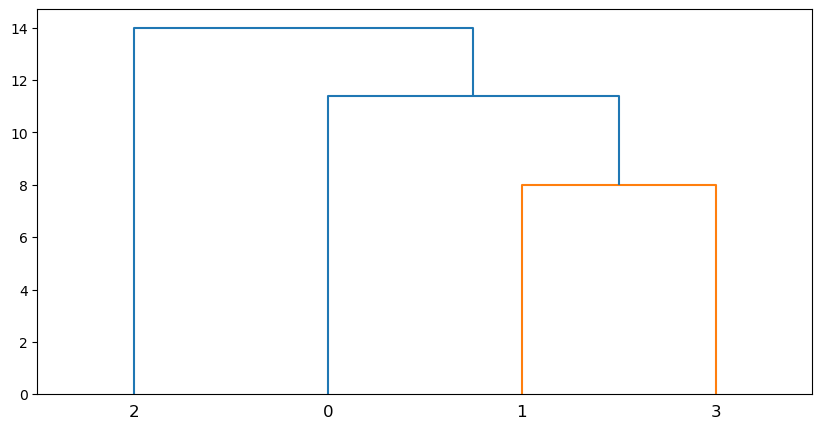

In [28]:
import numpy as np
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Datos de entrada
x = np.array([[1,1], [2,2], [3,3], [4,4], [5,5]])
y = np.array([[2,2], [3,3], [4,4]])

def dtw_distance(x, y):
    distance, path = fastdtw(x, y, dist=euclidean)
    return distance

D = np.zeros((4, 4))
for i in range(4):
    for j in range(i+1, 3):
        distance = dtw_distance(x[i:], y[j:])
        D[i,j] = distance
        D[j,i] = distance
        
Z = linkage(D, method='complete')

plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.show()





In [38]:
import pandas as pd

# Creamos un DataFrame con una columna de hora de inicio y una columna de hora de fin
df = pd.DataFrame({'hora_inicio': ['4'], 'hora_fin': ['6'], 'valor': [400]})

df['hora_inicio'] = pd.to_datetime(df['hora_inicio'], format='%H')
df['hora_fin'] = pd.to_datetime(df['hora_fin'], format='%H')

for i in df.index:
    if df.loc[i, 'hora_inicio'] = 4 and df.loc[i, 'hora_fin']= 6:
        fila1 = {'hora_inicio': df.loc[i, 'hora_inicio'], 'hora_fin': '5:00:00', 'valor': df.loc[i, 'Promedio carros']}
        fila2 = {'hora_inicio': '5:00:00', 'hora_fin': df.loc[i, 'hora_fin'], 'valor': df.loc[i, 'Promedio carros']}
        df = df.drop(i).append([fila1, fila2], ignore_index=True)

print(df)

           hora_inicio             hora_fin  valor
0  1900-01-01 04:00:00              5:00:00    400
1              5:00:00  1900-01-01 06:00:00    400


C:\Users\acdzapata\AppData\Local\Temp\ipykernel_1704\2723928129.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.drop(i).append([fila1, fila2], ignore_index=True)


In [38]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# crear un DataFrame de pandas con algunos datos de ventas diarias
data = {'fecha': pd.date_range(start='2022-01-01', end='2022-01-10', freq='D'),
        'ventas': [100, 80, 110, np.nan, 120, np.nan, 90, 100, np.nan, 80]}

df = pd.DataFrame(data)

In [39]:
df.head()

,fecha,ventas
0,2022-01-01,100.0
1,2022-01-02,80.0
2,2022-01-03,110.0
3,2022-01-04,NaN
4,2022-01-05,120.0


In [40]:
# crear un conjunto de datos de entrenamiento y un conjunto de datos de prueba
df_train = df.dropna()
df_test = df[df.isnull().any(axis=1)]


In [48]:
df_train['fecha_num'] = df_train['fecha'].apply(lambda x: x.toordinal())
df_test['fecha_num'] = df_test['fecha'].apply(lambda x: x.toordinal())

C:\Users\acdzapata\AppData\Local\Temp\ipykernel_19192\1035890834.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['fecha_num'] = df_train['fecha'].apply(lambda x: x.toordinal())
C:\Users\acdzapata\AppData\Local\Temp\ipykernel_19192\1035890834.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['fecha_num'] = df_test['fecha'].apply(lambda x: x.toordinal())


In [49]:
df_test

,fecha,ventas,fecha_num
3,2022-01-04,NaN,738159
5,2022-01-06,NaN,738161
8,2022-01-09,NaN,738164


In [50]:
# crear modelo de regresión lineal
model = LinearRegression()

# ajustar el modelo a los datos de entrenamiento
model.fit(df_train[['fecha_num']], df_train['ventas'])



LinearRegression()

In [51]:
df_test

,fecha,ventas,fecha_num
3,2022-01-04,NaN,738159
5,2022-01-06,NaN,738161
8,2022-01-09,NaN,738164


In [52]:
# hacer predicciones en el conjunto de prueba
df_test['ventas'] = model.predict(df_test[['fecha_num']])

C:\Users\acdzapata\AppData\Local\Temp\ipykernel_19192\3831338624.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['ventas'] = model.predict(df_test[['fecha_num']])


In [12]:
# ajustar un modelo de regresión lineal al conjunto de entrenamiento
model = LinearRegression()
model.fit(df_train['fecha'].values.reshape(-1, 1), df_train['ventas'])

ValueError: could not convert string to float: '2022-01-01'

In [13]:
# hacer predicciones en el conjunto de prueba
df_test['ventas'] = model.predict(df_test['fecha'].values.reshape(-1, 1))

TypeError: The DType <class 'numpy.dtype[datetime64]'> could not be promoted by <class 'numpy.dtype[float64]'>. This means that no common DType exists for the given inputs. For example they cannot be stored in a single array unless the dtype is `object`. The full list of DTypes is: (<class 'numpy.dtype[datetime64]'>, <class 'numpy.dtype[float64]'>)

In [53]:
# combinar el conjunto de entrenamiento y el conjunto de prueba
df_filled = pd.concat([df_train, df_test], axis=0)
df_filled = df_filled.sort_values(by='fecha').reset_index(drop=True)

print(df_filled)

       fecha      ventas  fecha_num
0 2022-01-01  100.000000     738156
1 2022-01-02   80.000000     738157
2 2022-01-03  110.000000     738158
3 2022-01-04   98.461538     738159
4 2022-01-05  120.000000     738160
5 2022-01-06   96.153846     738161
6 2022-01-07   90.000000     738162
7 2022-01-08  100.000000     738163
8 2022-01-09   92.692308     738164
9 2022-01-10   80.000000     738165


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns #graficar puntos faltantes
import matplotlib.pyplot as plt #gaficar boxplot
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_excel(r"Pronosticos_.xlsx",sheet_name="ConFecha")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78889 entries, 0 to 78888
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   semana            78889 non-null  object 
 1   Codmat            78889 non-null  object 
 2   cant              78889 non-null  float64
 3   semanacalendario  78889 non-null  float64
dtypes: float64(2), object(2)
memory usage: 2.4+ MB


In [4]:
df.semanacalendario =df.semanacalendario.astype('str')

In [5]:
df.head()

,semana,Codmat,cant,semanacalendario
0,2020-03-02,NN13-1000497,1891.000,2020.1
1,2020-03-02,NN13-1000498,544.333,2020.1
2,2020-03-02,NN13-1000794,4370.000,2020.1
3,2020-03-02,NN13-1000814,10.000,2020.1
4,2020-03-02,NN13-1000820,489.500,2020.1


In [6]:
df.semanacalendario = df.semanacalendario.apply(\
    lambda x: x + '0' if len(x.split('.')[-1]) == 1 else x)

In [7]:
#Restructura la tabla 
dfs=df.pivot(index='semana',columns="Codmat",values='cant')
dfs

Codmat,NN13-1000497,NN13-1000498,NN13-1000794,NN13-1000814,NN13-1000820,NN13-1000821,NN13-1000833,NN13-1000840,NN13-1000845,NN13-1000849,...,NNB8-1045787,NNB8-1046292,NNB8-1047173,NNB8-1047642,NNB8-1047909,NNB8-1049156,NNB8-1053497,NNB8-1054251,NNB8-1055778,NNB8-1055779
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,1891.0,544.333,4370.0,10.0,489.5,56.0,976.500,56.0,1842.0,433.000,...,126.0,1301.854,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-09,1393.0,1095.333,3421.0,20.0,782.5,70.0,1177.000,150.0,2863.0,371.000,...,203.0,1334.426,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-16,2639.0,305.000,4253.0,31.0,354.0,66.0,515.500,45.5,1543.0,796.000,...,159.0,1880.568,13.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-23,2957.0,220.334,6052.0,24.0,564.0,80.0,950.000,58.0,2294.0,723.000,...,1.0,1829.283,11.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-30,2680.0,347.333,4788.0,9.0,462.5,44.0,907.000,45.5,1805.0,589.000,...,107.0,1541.282,7.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-16,1869.0,1180.000,1134.0,NaN,667.5,68.0,1584.500,81.0,4589.0,562.000,...,631.0,1712.995,144.871,161.0,NaN,NaN,534.909,30.0,NaN,NaN
2023-01-23,1573.0,319.667,866.0,30.0,636.5,177.0,1270.438,118.0,2134.0,461.757,...,331.0,1476.067,121.012,72.0,NaN,NaN,389.909,39.0,NaN,NaN
2023-01-30,2155.0,484.333,1074.0,NaN,647.0,36.0,891.000,87.0,4432.0,508.000,...,452.9,1554.283,88.184,121.0,NaN,NaN,460.909,16.0,NaN,NaN


<AxesSubplot:xlabel='Codmat', ylabel='semana'>

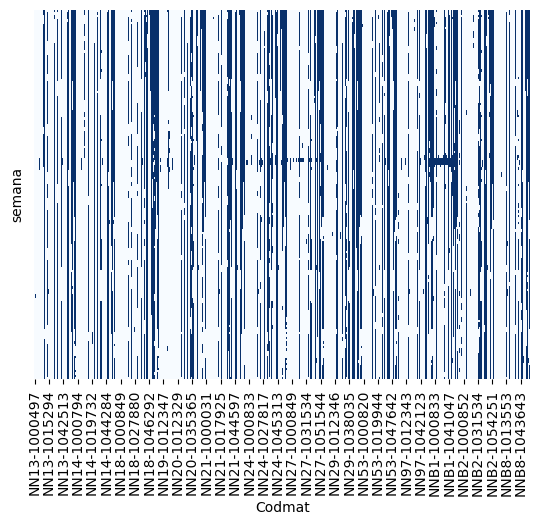

In [8]:
#identificar faltaltes en las series (azul oscuro zonas con datos faltantes)
sns.heatmap(dfs.isnull(), yticklabels=False, cbar=False, cmap = "Blues")

# Limpieza

### Restricción últimas 4 semanas
* Existen materiales que no tienen información de venta de las ultimas 4 semanas. Se decide seleccionar estos materiales y socializarlos con el área de negocio (regla 1).

In [9]:
#Creterio: Excluir series que le falten las últimas 4 semanas y revisar en detalle
w4=dfs[-4:].isnull().sum()
sem4=w4[w4==4]
fw4=pd.DataFrame(sem4.index)

In [10]:
#materiales que cumplen
fw=w4[w4<4]
fw=pd.DataFrame(fw.index)
#fw

In [11]:
#seleccionamos del dataframe orignal los que sirven
dfp_2=pd.merge(df,fw,how='inner',left_on='Codmat',right_on='Codmat')
dfp_2

,semana,Codmat,cant,semanacalendario
0,2020-03-02,NN13-1000497,1891.000,2020.10
1,2020-03-09,NN13-1000497,1393.000,2020.11
2,2020-03-16,NN13-1000497,2639.000,2020.12
3,2020-03-23,NN13-1000497,2957.000,2020.13
4,2020-03-30,NN13-1000497,2680.000,2020.14
...,...,...,...,...
74995,2023-01-16,NN21-1032957,2288.000,2023.03
74996,2023-01-23,NN21-1032957,1784.292,2023.04
74997,2023-01-30,NN21-1032957,3696.000,2023.05
74998,2023-02-06,NN21-1032957,3344.000,2023.06


In [12]:
#actualizar series de tiempo con información reciente
dfs_2=dfs.drop(sem4.index,axis=1)
dfs_2

Codmat,NN13-1000497,NN13-1000498,NN13-1000794,NN13-1000814,NN13-1000820,NN13-1000821,NN13-1000833,NN13-1000840,NN13-1000845,NN13-1000849,...,NNB8-1035619,NNB8-1042123,NNB8-1043327,NNB8-1043643,NNB8-1045787,NNB8-1046292,NNB8-1047173,NNB8-1047642,NNB8-1053497,NNB8-1054251
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,1891.0,544.333,4370.0,10.0,489.5,56.0,976.500,56.0,1842.0,433.000,...,72.0,100.000,718.000,614.0,126.0,1301.854,NaN,NaN,NaN,NaN
2020-03-09,1393.0,1095.333,3421.0,20.0,782.5,70.0,1177.000,150.0,2863.0,371.000,...,70.0,138.000,719.500,617.0,203.0,1334.426,NaN,NaN,NaN,NaN
2020-03-16,2639.0,305.000,4253.0,31.0,354.0,66.0,515.500,45.5,1543.0,796.000,...,24.0,159.000,843.750,602.0,159.0,1880.568,13.000,NaN,NaN,NaN
2020-03-23,2957.0,220.334,6052.0,24.0,564.0,80.0,950.000,58.0,2294.0,723.000,...,47.0,171.000,858.250,424.0,1.0,1829.283,11.000,NaN,NaN,NaN
2020-03-30,2680.0,347.333,4788.0,9.0,462.5,44.0,907.000,45.5,1805.0,589.000,...,59.0,186.000,731.750,688.0,107.0,1541.282,7.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-16,1869.0,1180.000,1134.0,NaN,667.5,68.0,1584.500,81.0,4589.0,562.000,...,62.0,60.000,501.637,1025.5,631.0,1712.995,144.871,161.0,534.909,30.0
2023-01-23,1573.0,319.667,866.0,30.0,636.5,177.0,1270.438,118.0,2134.0,461.757,...,44.0,47.236,597.000,1180.0,331.0,1476.067,121.012,72.0,389.909,39.0
2023-01-30,2155.0,484.333,1074.0,NaN,647.0,36.0,891.000,87.0,4432.0,508.000,...,42.0,51.000,498.000,1036.0,452.9,1554.283,88.184,121.0,460.909,16.0


## Completitud de la serie

* Existen materiales que presentan un porcentaje de valores perdidos mayor al 20% se recomienda revisar estas series (regla 2).

In [13]:
#dfp_2.groupby(['codmat']).semana.agg({'Minimun_Date': "min",  'Maximun_Date': "max",'Cant_sem':np.count_nonzero})
dfcomp=dfp_2.groupby('Codmat')['semana'].agg(Minimun_Date='min',Maximun_Date='max',Cant_sem=np.count_nonzero)
#convertir columnas a fecha
dfcomp['Maximun_Date'] = pd.to_datetime(dfcomp['Maximun_Date'])
dfcomp['Minimun_Date']=pd.to_datetime(dfcomp['Minimun_Date'])

#pasara a semanas de direrencia
dfcomp['sem_rang']=np.floor((dfcomp['Maximun_Date']-dfcomp['Minimun_Date']).dt.days)/7

#procentajes de completitud
dfcomp['porcomp']=dfcomp['Cant_sem']/dfcomp['sem_rang']
#mostrar data frame
dfcomp

,Minimun_Date,Maximun_Date,Cant_sem,sem_rang,porcomp
Codmat,,,,,
NN13-1000497,2020-03-02,2023-02-13,155,154.0,1.006494
NN13-1000498,2020-03-02,2023-02-13,153,154.0,0.993506
NN13-1000794,2020-03-02,2023-02-13,155,154.0,1.006494
NN13-1000814,2020-03-02,2023-01-23,89,151.0,0.589404
NN13-1000820,2020-03-02,2023-02-13,155,154.0,1.006494
...,...,...,...,...,...
NNB8-1046292,2020-03-02,2023-02-13,155,154.0,1.006494
NNB8-1047173,2020-03-16,2023-02-13,153,152.0,1.006579
NNB8-1047642,2020-10-26,2023-02-13,121,120.0,1.008333


In [14]:
#Filtro series >= 80%
m1=dfcomp['porcomp']>=0.7
m2=dfcomp['porcomp']<0.7

dfs_comp=dfcomp[m1].index
dfs_comp

Index(['NN13-1000497', 'NN13-1000498', 'NN13-1000794', 'NN13-1000820',
       'NN13-1000821', 'NN13-1000833', 'NN13-1000840', 'NN13-1000845',
       'NN13-1000849', 'NN13-1000852',
       ...
       'NNB8-1035619', 'NNB8-1042123', 'NNB8-1043327', 'NNB8-1043643',
       'NNB8-1045787', 'NNB8-1046292', 'NNB8-1047173', 'NNB8-1047642',
       'NNB8-1053497', 'NNB8-1054251'],
      dtype='object', name='Codmat', length=509)

In [15]:
#Actualizar series con completidud mayor o igual al 80%
dfs_3=dfs_2[dfs_comp]
dfs_3

Codmat,NN13-1000497,NN13-1000498,NN13-1000794,NN13-1000820,NN13-1000821,NN13-1000833,NN13-1000840,NN13-1000845,NN13-1000849,NN13-1000852,...,NNB8-1035619,NNB8-1042123,NNB8-1043327,NNB8-1043643,NNB8-1045787,NNB8-1046292,NNB8-1047173,NNB8-1047642,NNB8-1053497,NNB8-1054251
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,1891.0,544.333,4370.0,489.5,56.0,976.500,56.0,1842.0,433.000,1055.00,...,72.0,100.000,718.000,614.0,126.0,1301.854,NaN,NaN,NaN,NaN
2020-03-09,1393.0,1095.333,3421.0,782.5,70.0,1177.000,150.0,2863.0,371.000,1068.00,...,70.0,138.000,719.500,617.0,203.0,1334.426,NaN,NaN,NaN,NaN
2020-03-16,2639.0,305.000,4253.0,354.0,66.0,515.500,45.5,1543.0,796.000,1685.00,...,24.0,159.000,843.750,602.0,159.0,1880.568,13.000,NaN,NaN,NaN
2020-03-23,2957.0,220.334,6052.0,564.0,80.0,950.000,58.0,2294.0,723.000,2500.00,...,47.0,171.000,858.250,424.0,1.0,1829.283,11.000,NaN,NaN,NaN
2020-03-30,2680.0,347.333,4788.0,462.5,44.0,907.000,45.5,1805.0,589.000,1702.00,...,59.0,186.000,731.750,688.0,107.0,1541.282,7.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-16,1869.0,1180.000,1134.0,667.5,68.0,1584.500,81.0,4589.0,562.000,837.00,...,62.0,60.000,501.637,1025.5,631.0,1712.995,144.871,161.0,534.909,30.0
2023-01-23,1573.0,319.667,866.0,636.5,177.0,1270.438,118.0,2134.0,461.757,780.75,...,44.0,47.236,597.000,1180.0,331.0,1476.067,121.012,72.0,389.909,39.0
2023-01-30,2155.0,484.333,1074.0,647.0,36.0,891.000,87.0,4432.0,508.000,886.00,...,42.0,51.000,498.000,1036.0,452.9,1554.283,88.184,121.0,460.909,16.0


In [16]:
fw2=pd.DataFrame(dfs_3.columns)
dfp_3=pd.merge(dfp_2,fw2,how='inner',left_on='Codmat',right_on='Codmat')
dfp_3

,semana,Codmat,cant,semanacalendario
0,2020-03-02,NN13-1000497,1891.000,2020.10
1,2020-03-09,NN13-1000497,1393.000,2020.11
2,2020-03-16,NN13-1000497,2639.000,2020.12
3,2020-03-23,NN13-1000497,2957.000,2020.13
4,2020-03-30,NN13-1000497,2680.000,2020.14
...,...,...,...,...
73608,2023-01-16,NN21-1032957,2288.000,2023.03
73609,2023-01-23,NN21-1032957,1784.292,2023.04
73610,2023-01-30,NN21-1032957,3696.000,2023.05
73611,2023-02-06,NN21-1032957,3344.000,2023.06


## Secuencia de NA en la serie

* Una vez se depuran aquellos materiales con una completitud menor al 80%, se encontró series con valores perdidos en secuencia, los cual dificultad el proceso de imputación de valores perdidos. Se recomienda revisar estas series. (Regla3)

In [17]:
#Encontrar secuencias de NA en la serie 

#listas para guardar los resultados
racha=[]
racha_count=[]
nulos=[]
l=range(0,dfs_3.shape[1])
#Bluce para recorrer la cantidad de series
for i in l:
  #extracción de la serie
  serie=pd.DataFrame(dfs_3.iloc[:,i]).astype(str)
  cod=serie.columns[0]
 
  rf=dfcomp[dfcomp.index==cod]
  m3=serie.index>=min(rf['Minimun_Date'].astype(str))
  serie=serie.iloc[m3]

  #Conteo de racha
  serie['racha']=serie.iloc[:,0].groupby((serie.iloc[:,0]!=serie.iloc[:,0].shift()).cumsum()).cumcount()+1
  secue_na=serie[serie.iloc[:,0]=='nan']['racha'].max()
    
  #Guardar los resultados
  racha.append(cod)
  nulos.append((serie.iloc[:,0]=='nan').sum())
  racha_count.append(secue_na)

secuencia=pd.DataFrame(nulos,racha)
secuencia['Racha_Count']= racha_count
secuencia.columns=['Nulos','Racha_Nulos']
secuencia=secuencia.fillna(0)
secuencia

,Nulos,Racha_Nulos
NN13-1000497,0,0.0
NN13-1000498,2,2.0
NN13-1000794,0,0.0
NN13-1000820,0,0.0
NN13-1000821,0,0.0
...,...,...
NNB8-1046292,0,0.0
NNB8-1047173,0,0.0
NNB8-1047642,0,0.0
NNB8-1053497,0,0.0


In [18]:
#unir todo en un solo dataframe
dfcomp_2=pd.merge(dfcomp,secuencia,how='inner',left_index=True,right_index=True)
dfcomp_2

,Minimun_Date,Maximun_Date,Cant_sem,sem_rang,porcomp,Nulos,Racha_Nulos
NN13-1000497,2020-03-02,2023-02-13,155,154.0,1.006494,0,0.0
NN13-1000498,2020-03-02,2023-02-13,153,154.0,0.993506,2,2.0
NN13-1000794,2020-03-02,2023-02-13,155,154.0,1.006494,0,0.0
NN13-1000820,2020-03-02,2023-02-13,155,154.0,1.006494,0,0.0
NN13-1000821,2020-03-02,2023-02-13,155,154.0,1.006494,0,0.0
...,...,...,...,...,...,...,...
NNB8-1046292,2020-03-02,2023-02-13,155,154.0,1.006494,0,0.0
NNB8-1047173,2020-03-16,2023-02-13,153,152.0,1.006579,0,0.0
NNB8-1047642,2020-10-26,2023-02-13,121,120.0,1.008333,0,0.0
NNB8-1053497,2021-12-06,2023-02-13,63,62.0,1.016129,0,0.0


In [19]:
#extraer rachas mayores a 3 
dfs_4=  dfs_3[dfcomp_2[dfcomp_2['Racha_Nulos']<=3].index]
dfs_iqr=dfs_3[dfcomp_2[dfcomp_2['Racha_Nulos']<=3].index]
#dfs_1sd=dfs_3[dfcomp_2[dfcomp_2['Racha_Nulos']<=3].index]
#dfs_2sd=dfs_3[dfcomp_2[dfcomp_2['Racha_Nulos']<=3].index]
#dfs_3sd=dfs_3[dfcomp_2[dfcomp_2['Racha_Nulos']<=3].index]

#covertir indice en datetime
dfs_4.index = pd.to_datetime(dfs_4.index)
dfs_iqr.index=pd.to_datetime(dfs_iqr.index)
dfs_4.head(5)

Codmat,NN13-1000497,NN13-1000498,NN13-1000794,NN13-1000820,NN13-1000821,NN13-1000833,NN13-1000845,NN13-1000849,NN13-1000852,NN13-1000853,...,NNB8-1035619,NNB8-1042123,NNB8-1043327,NNB8-1043643,NNB8-1045787,NNB8-1046292,NNB8-1047173,NNB8-1047642,NNB8-1053497,NNB8-1054251
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,1891.0,544.333,4370.0,489.5,56.0,976.5,1842.0,433.0,1055.0,644.0,...,72.0,100.0,718.00,614.0,126.0,1301.854,NaN,NaN,NaN,NaN
2020-03-09,1393.0,1095.333,3421.0,782.5,70.0,1177.0,2863.0,371.0,1068.0,630.0,...,70.0,138.0,719.50,617.0,203.0,1334.426,NaN,NaN,NaN,NaN
2020-03-16,2639.0,305.000,4253.0,354.0,66.0,515.5,1543.0,796.0,1685.0,773.0,...,24.0,159.0,843.75,602.0,159.0,1880.568,13.0,NaN,NaN,NaN
2020-03-23,2957.0,220.334,6052.0,564.0,80.0,950.0,2294.0,723.0,2500.0,1138.0,...,47.0,171.0,858.25,424.0,1.0,1829.283,11.0,NaN,NaN,NaN
2020-03-30,2680.0,347.333,4788.0,462.5,44.0,907.0,1805.0,589.0,1702.0,1093.0,...,59.0,186.0,731.75,688.0,107.0,1541.282,7.0,NaN,NaN,NaN


In [20]:
#Funciones para calcular las series con tratamiento de datos atípicos 
# Metodo del rango intercuartilico Q3+1.5(Q3-Q1) y Q1-1.5(Q3-Q1)
# Metos de la media + 1(68.3%),2(95.4%) y 3(99.7) desviaciones estandar 

def iqr(x):
  #atípicos por IQR
    #print(type(x))
    #x=pd.DataFrame(x)
    Q1=x.quantile(q=0.25)
    Q3=x.quantile(q=0.75)
    IQR=Q3-Q1
    LS=Q3+1.5*IQR
    LI=Q1-1.5*IQR
    m4=x>LS
    m5=x<LI
    #print(x.dtype  )
    #asigna limte superior a los que se salieron del rango
    for material in list(x.columns.values):
        x.loc[m4[material],material]=LS[material]
        
    for material in list(x.columns.values):
        x.loc[m5[material],material]=LI[material]   
        
    return x

In [21]:
#resultados de las series 
#dfs_iqr=dfs_iqr.astype(float)
#dfs_iqr.iloc[:, 0:2].apply(iqr,axis=0)
dfs_iqr.transform(iqr,axis=0)
dfs_iqr=dfs_iqr.rename(columns=lambda x: str(x) + '_IQR')

#dfs_1sd.iloc[:, 0:1].apply(sd1,axis=0)
#dfs_1sd=dfs_1sd.rename(columns=lambda x: str(x) + '_1sd')

#dfs_2sd.apply(sd2,axis=0)
#dfs_2sd=dfs_2sd.rename(columns=lambda x: str(x) + '_2sd')

#dfs_3sd.apply(sd3,axis=0)
#dfs_3sd=dfs_3sd.rename(columns=lambda x: str(x) + '_3sd')

In [22]:
dfs_iqr.index.max() 

Timestamp('2023-02-13 00:00:00')

In [23]:
import plotly.graph_objects as go
def Tendencia (X, Y, TituloGraf, LeyendaX, LeyendaY, ): 

    fig = go.Figure(layout=go.Layout(xaxis={'type': 'category','title':LeyendaX} ,
                                 title = TituloGraf,
                                 yaxis = dict(title = LeyendaY)))
    fig.add_trace(go.Scatter(x=X, y=Y,
                    mode='lines+markers', 
                    #name='Ventas',
                    #showlegend  =  True
                       
                       ))


    fig.show()

In [24]:
dfs=pd.merge(dfs_4,dfs_iqr,how='inner', left_index=True, right_index=True)

In [25]:
#fecha minimas y maximas para los 5 escenarios 
dfcomp_f=dfp_2.groupby(['Codmat'])
dfcomp_f=dfcomp_f.agg(Minimun_Date=('semana',np.min),Maximun_Date=('semana',np.max),Cant_sem=('semana',np.count_nonzero))

dfcomp_iqr=dfp_2.groupby(['Codmat'])
dfcomp_iqr=dfcomp_iqr.agg(Minimun_Date=('semana',np.min),Maximun_Date=('semana',np.max),Cant_sem=('semana',np.count_nonzero))
dfcomp_iqr=dfcomp_iqr.rename(index=lambda x: str(x) + '_IQR')

dfcomp_f=dfcomp_f.append(dfcomp_iqr)
#dfcomp_f=dfcomp_f.append(dfcomp_1sd)
#dfcomp_f=dfcomp_f.append(dfcomp_2sd)
#dfcomp_f=dfcomp_f.append(dfcomp_3sd)
dfcomp_f

,Minimun_Date,Maximun_Date,Cant_sem
Codmat,,,
NN13-1000497,2020-03-02,2023-02-13,155
NN13-1000498,2020-03-02,2023-02-13,153
NN13-1000794,2020-03-02,2023-02-13,155
NN13-1000814,2020-03-02,2023-01-23,89
NN13-1000820,2020-03-02,2023-02-13,155
...,...,...,...
NNB8-1046292_IQR,2020-03-02,2023-02-13,155
NNB8-1047173_IQR,2020-03-16,2023-02-13,153
NNB8-1047642_IQR,2020-10-26,2023-02-13,121


# Análisis

In [26]:
dfp_3

,semana,Codmat,cant,semanacalendario
0,2020-03-02,NN13-1000497,1891.000,2020.10
1,2020-03-09,NN13-1000497,1393.000,2020.11
2,2020-03-16,NN13-1000497,2639.000,2020.12
3,2020-03-23,NN13-1000497,2957.000,2020.13
4,2020-03-30,NN13-1000497,2680.000,2020.14
...,...,...,...,...
73608,2023-01-16,NN21-1032957,2288.000,2023.03
73609,2023-01-23,NN21-1032957,1784.292,2023.04
73610,2023-01-30,NN21-1032957,3696.000,2023.05
73611,2023-02-06,NN21-1032957,3344.000,2023.06


In [27]:
dfp_3['Semana Corregida']=pd.to_datetime(dfp_3['semana'])

In [28]:
dfp_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73613 entries, 0 to 73612
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   semana            73613 non-null  object        
 1   Codmat            73613 non-null  object        
 2   cant              73613 non-null  float64       
 3   semanacalendario  73613 non-null  object        
 4   Semana Corregida  73613 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 3.4+ MB


In [29]:
dfs.head()

Codmat,NN13-1000497,NN13-1000498,NN13-1000794,NN13-1000820,NN13-1000821,NN13-1000833,NN13-1000845,NN13-1000849,NN13-1000852,NN13-1000853,...,NNB8-1035619_IQR,NNB8-1042123_IQR,NNB8-1043327_IQR,NNB8-1043643_IQR,NNB8-1045787_IQR,NNB8-1046292_IQR,NNB8-1047173_IQR,NNB8-1047642_IQR,NNB8-1053497_IQR,NNB8-1054251_IQR
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,1891.0,544.333,4370.0,489.5,56.0,976.5,1842.0,433.0,1055.0,644.0,...,72.0,100.0,718.0000,614.0,126.0,1301.854,NaN,NaN,NaN,NaN
2020-03-09,1393.0,1095.333,3421.0,782.5,70.0,1177.0,2863.0,371.0,1068.0,630.0,...,70.0,138.0,719.5000,617.0,203.0,1334.426,NaN,NaN,NaN,NaN
2020-03-16,2639.0,305.000,4253.0,354.0,66.0,515.5,1543.0,796.0,1685.0,773.0,...,24.0,159.0,792.9375,602.0,159.0,1668.529,14.0625,NaN,NaN,NaN
2020-03-23,2957.0,220.334,6052.0,564.0,80.0,950.0,2294.0,723.0,2500.0,1138.0,...,47.0,171.0,792.9375,424.0,1.0,1668.529,14.0625,NaN,NaN,NaN
2020-03-30,2680.0,347.333,4788.0,462.5,44.0,907.0,1805.0,589.0,1702.0,1093.0,...,59.0,186.0,731.7500,688.0,107.0,1541.282,14.0625,NaN,NaN,NaN


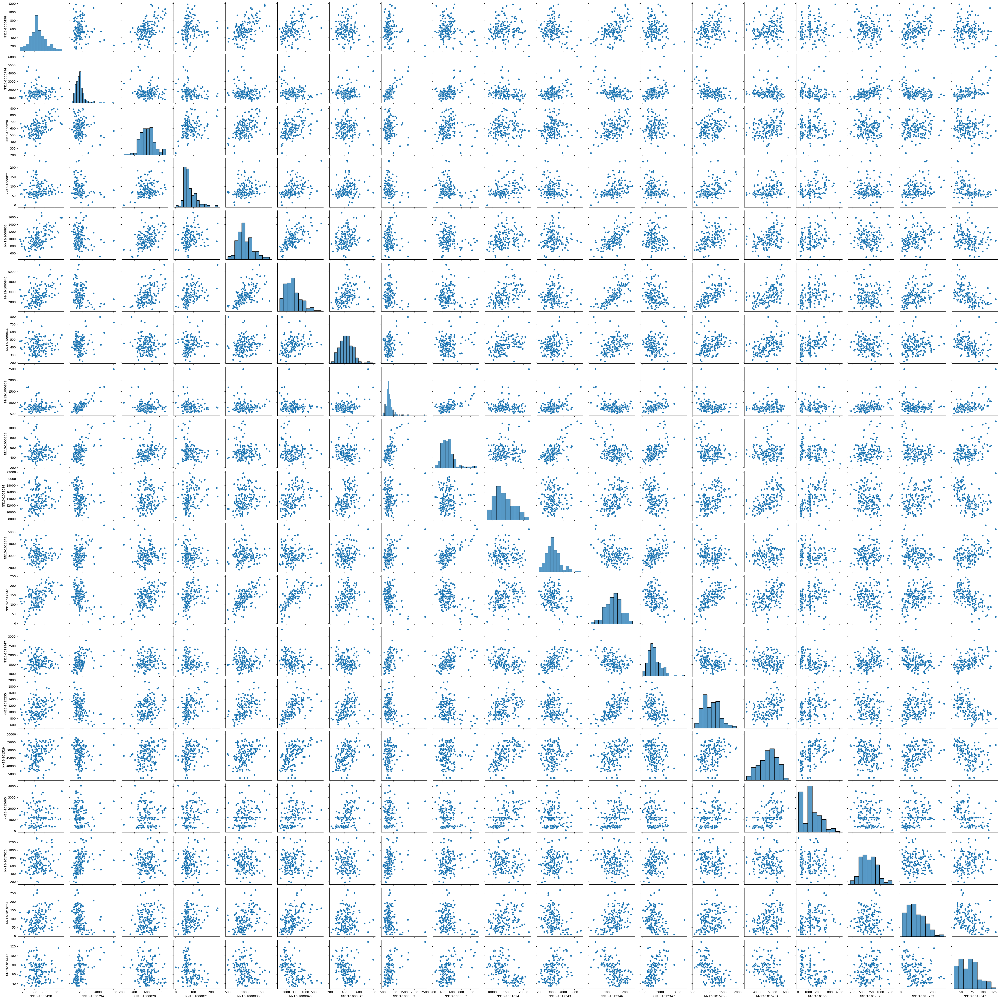

In [30]:
sns.pairplot(dfs.iloc[:,1:20])

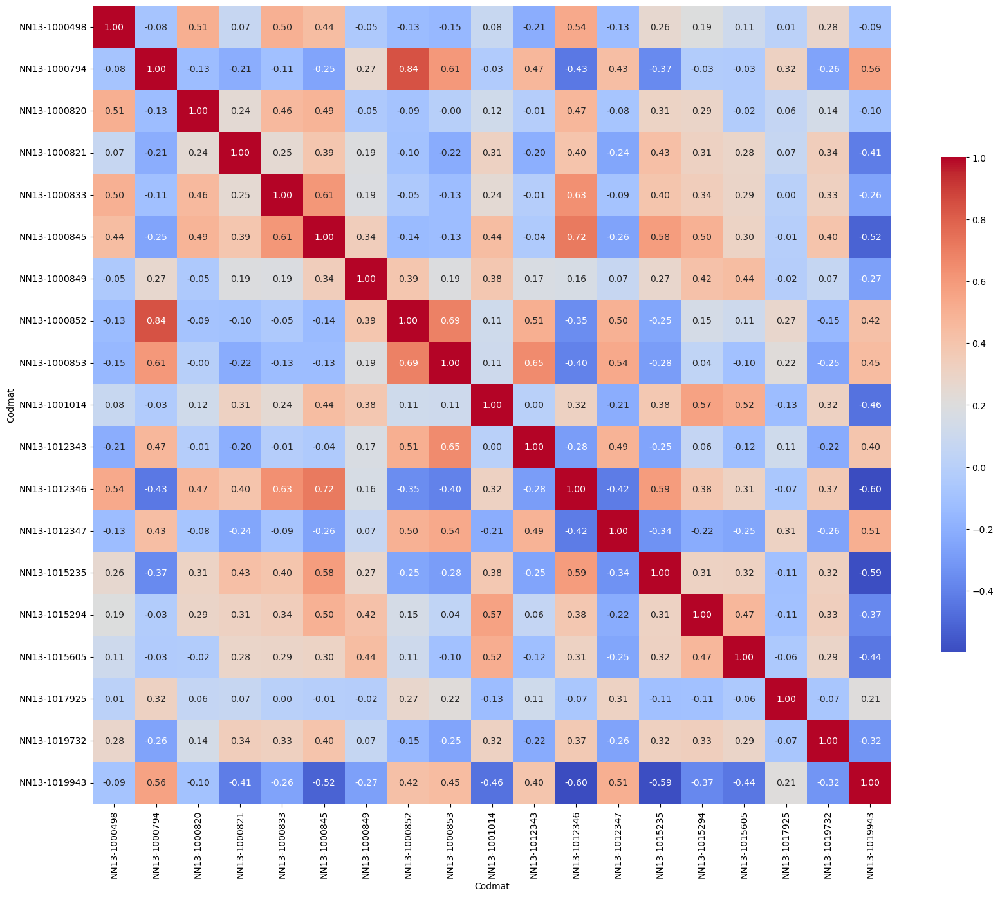

In [31]:
correlation=dfs.iloc[:,1:20].corr(method='pearson')
g=sns.heatmap(correlation,square=True,cbar_kws={"shrink": .5},annot=True,fmt='.2f',cmap="coolwarm")
g.figure.set_size_inches(20,20)

plt.show()

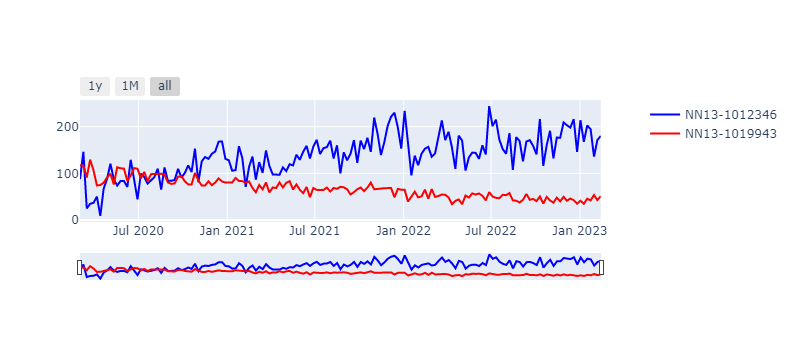

In [32]:
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
#fig=px.line(dfs, x=dfs.index,y='NN13-1012346', title = 'NN13-1012346 VS NN13-1019943')

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scatter(x=dfs.index,y=dfs['NN13-1012346'],
                         mode='lines', line=dict(color='blue'), legendrank=True, name="NN13-1012346"))
fig.add_trace(go.Scatter(x=dfs.index,y=dfs['NN13-1019943'], 
                         mode='lines', line=dict(color='red'), legendrank=True, name="NN13-1019943"))

fig.update_xaxes(rangeslider_visible=True)

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
                      dict(count=1, label='1y',step="year", stepmode="backward"),
                      dict(count=1, label='1M',step='month', stepmode="backward"),
                      dict(count=1, label='all',step='all', stepmode="backward")
                     ])
    ))
fig.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 50)'>

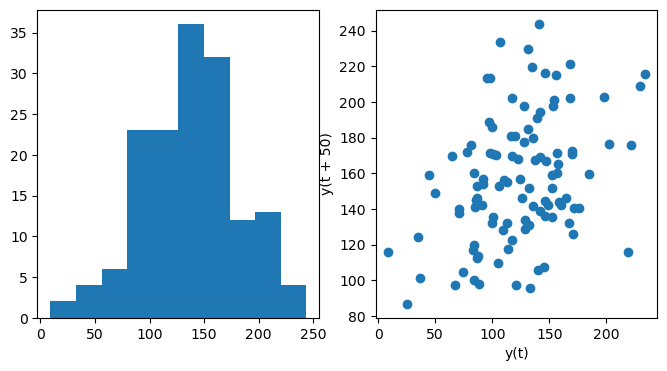

In [33]:
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].hist(dfs['NN13-1012346'])
pd.plotting.lag_plot(dfs['NN13-1012346'], lag=50, ax=axs[1])

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 50)'>

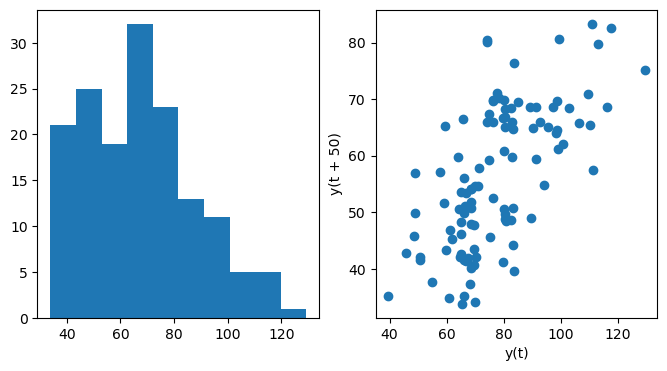

In [34]:
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].hist(dfs['NN13-1019943'])
pd.plotting.lag_plot(dfs['NN13-1019943'], lag=50, ax=axs[1])

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

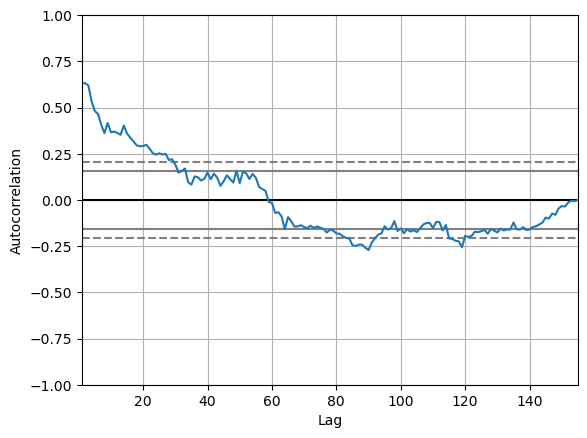

In [35]:
pd.plotting.autocorrelation_plot(dfs['NN13-1012346'])

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

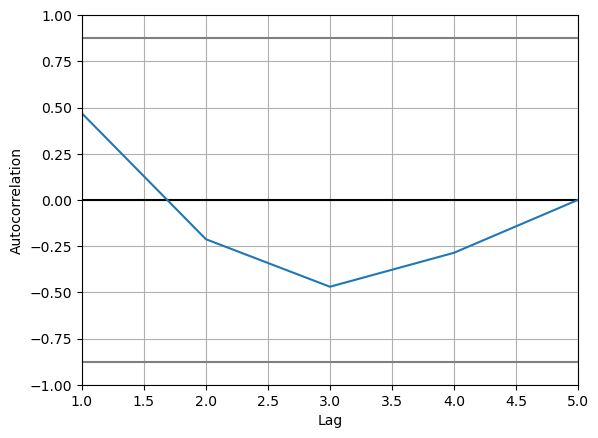

In [36]:
pd.plotting.autocorrelation_plot(dfs['NN13-1012346'].resample("50w").mean())

Se llevara la bd a un estilo largo, para poder continuar con el EDA por Semana, Linea y Centro

In [37]:
dfs_2=dfs.reset_index()
dfs_2

Codmat,semana,NN13-1000497,NN13-1000498,NN13-1000794,NN13-1000820,NN13-1000821,NN13-1000833,NN13-1000845,NN13-1000849,NN13-1000852,...,NNB8-1035619_IQR,NNB8-1042123_IQR,NNB8-1043327_IQR,NNB8-1043643_IQR,NNB8-1045787_IQR,NNB8-1046292_IQR,NNB8-1047173_IQR,NNB8-1047642_IQR,NNB8-1053497_IQR,NNB8-1054251_IQR
0,2020-03-02,1891.0,544.333,4370.0,489.5,56.0,976.500,1842.0,433.000,1055.00,...,72.0,100.000,718.0000,614.0,126.0,1301.854,NaN,NaN,NaN,NaN
1,2020-03-09,1393.0,1095.333,3421.0,782.5,70.0,1177.000,2863.0,371.000,1068.00,...,70.0,138.000,719.5000,617.0,203.0,1334.426,NaN,NaN,NaN,NaN
2,2020-03-16,2639.0,305.000,4253.0,354.0,66.0,515.500,1543.0,796.000,1685.00,...,24.0,159.000,792.9375,602.0,159.0,1668.529,14.0625,NaN,NaN,NaN
3,2020-03-23,2957.0,220.334,6052.0,564.0,80.0,950.000,2294.0,723.000,2500.00,...,47.0,171.000,792.9375,424.0,1.0,1668.529,14.0625,NaN,NaN,NaN
4,2020-03-30,2680.0,347.333,4788.0,462.5,44.0,907.000,1805.0,589.000,1702.00,...,59.0,186.000,731.7500,688.0,107.0,1541.282,14.0625,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,2023-01-16,1869.0,1180.000,1134.0,667.5,68.0,1584.500,4589.0,562.000,837.00,...,62.0,60.000,501.6370,1025.5,630.2,1668.529,144.8710,161.0,534.909,30.0
151,2023-01-23,1573.0,319.667,866.0,636.5,177.0,1270.438,2134.0,461.757,780.75,...,44.0,47.236,597.0000,1180.0,331.0,1476.067,121.0120,72.0,389.909,39.0
152,2023-01-30,2155.0,484.333,1074.0,647.0,36.0,891.000,4432.0,508.000,886.00,...,42.0,51.000,498.0000,1036.0,452.9,1554.283,88.1840,121.0,460.909,16.0
153,2023-02-06,2164.0,780.001,1194.0,786.5,232.0,934.000,3341.0,440.000,784.00,...,72.0,51.000,475.2500,1172.0,436.0,1418.281,69.1840,101.0,434.545,18.0


In [38]:
dfs_long = pd.melt(dfs_2, id_vars=dfs_2.columns.values[:1], value_vars=dfs_2.columns.values[1:])
dfs_long

,semana,Codmat,value
0,2020-03-02,NN13-1000497,1891.0
1,2020-03-09,NN13-1000497,1393.0
2,2020-03-16,NN13-1000497,2639.0
3,2020-03-23,NN13-1000497,2957.0
4,2020-03-30,NN13-1000497,2680.0
...,...,...,...
145385,2023-01-16,NNB8-1054251_IQR,30.0
145386,2023-01-23,NNB8-1054251_IQR,39.0
145387,2023-01-30,NNB8-1054251_IQR,16.0
145388,2023-02-06,NNB8-1054251_IQR,18.0


In [39]:
df_filtro_fecha_semanacalendario=df[['semana','semanacalendario']]
df_filtro_fecha_semanacalendario

,semana,semanacalendario
0,2020-03-02,2020.10
1,2020-03-02,2020.10
2,2020-03-02,2020.10
3,2020-03-02,2020.10
4,2020-03-02,2020.10
...,...,...
78884,2023-02-13,2023.07
78885,2023-02-13,2023.07
78886,2023-02-13,2023.07
78887,2023-02-13,2023.07


In [40]:
dfp_3

,semana,Codmat,cant,semanacalendario,Semana Corregida
0,2020-03-02,NN13-1000497,1891.000,2020.10,2020-03-02
1,2020-03-09,NN13-1000497,1393.000,2020.11,2020-03-09
2,2020-03-16,NN13-1000497,2639.000,2020.12,2020-03-16
3,2020-03-23,NN13-1000497,2957.000,2020.13,2020-03-23
4,2020-03-30,NN13-1000497,2680.000,2020.14,2020-03-30
...,...,...,...,...,...
73608,2023-01-16,NN21-1032957,2288.000,2023.03,2023-01-16
73609,2023-01-23,NN21-1032957,1784.292,2023.04,2023-01-23
73610,2023-01-30,NN21-1032957,3696.000,2023.05,2023-01-30
73611,2023-02-06,NN21-1032957,3344.000,2023.06,2023-02-06


In [41]:
dfp_3['centro']=dfp_3['Codmat'].apply(lambda x: x.split('-')[0])
dfp_3['numeroSemana']=dfp_3['semanacalendario'].apply(lambda x: x.split('.')[1])

In [42]:
dfp_3

,semana,Codmat,cant,semanacalendario,Semana Corregida,centro,numeroSemana
0,2020-03-02,NN13-1000497,1891.000,2020.10,2020-03-02,NN13,10
1,2020-03-09,NN13-1000497,1393.000,2020.11,2020-03-09,NN13,11
2,2020-03-16,NN13-1000497,2639.000,2020.12,2020-03-16,NN13,12
3,2020-03-23,NN13-1000497,2957.000,2020.13,2020-03-23,NN13,13
4,2020-03-30,NN13-1000497,2680.000,2020.14,2020-03-30,NN13,14
...,...,...,...,...,...,...,...
73608,2023-01-16,NN21-1032957,2288.000,2023.03,2023-01-16,NN21,03
73609,2023-01-23,NN21-1032957,1784.292,2023.04,2023-01-23,NN21,04
73610,2023-01-30,NN21-1032957,3696.000,2023.05,2023-01-30,NN21,05
73611,2023-02-06,NN21-1032957,3344.000,2023.06,2023-02-06,NN21,06


In [43]:
lineas=pd.read_excel(r"Pronosticos_.xlsx",sheet_name="ConLinea")

In [44]:
lineas

,Codmat,Cantidad,Semana,Linea
0,DRA0-1045855,1.0,2020.11,NaN
1,DRA0-1045855,3.0,2020.52,NaN
2,DRA0-1045855,3.0,2020.53,NaN
3,DRA0-1045855,4.0,2021.04,NaN
4,DRA0-1045855,4.0,2021.07,NaN
...,...,...,...,...
347714,NNB8-2014921,19.0,2022.11,Esparcibles y/o untables
347715,NNB8-2014921,19.0,2021.45,Esparcibles y/o untables
347716,NNB8-2014921,20.0,2022.01,Esparcibles y/o untables
347717,NNB8-2014921,21.0,2021.21,Esparcibles y/o untables


In [45]:
df_codmat_lineas = lineas[['Codmat','Linea']]
df_codmat_lineas =df_codmat_lineas.drop_duplicates()

In [46]:
df_codmat_lineas

,Codmat,Linea
0,DRA0-1045855,NaN
150,DRA0-1045856,NaN
305,DRA0-1045857,NaN
446,DRA0-1057997,NaN
450,DRA1-1045855,NaN
...,...,...
347281,NNB8-2012051,"Papas, yucas y patacones"
347376,NNB8-2012794,"Papas, yucas y patacones"
347480,NNB8-2012795,"Papas, yucas y patacones"
347577,NNB8-2014635,Otros Distribuidos


In [47]:
dfp_3_lineas= dfp_3.merge(df_codmat_lineas, how='inner', on='Codmat')

In [48]:
dfp_3_lineas = dfp_3_lineas.sort_values(by='numeroSemana', ascending=True)
dfp_3_lineas

,semana,Codmat,cant,semanacalendario,Semana Corregida,centro,numeroSemana,Linea
44185,2021-01-04,NN53-1000833,45.000,2021.01,2021-01-04,NN53,01,Salchicha
50529,2022-01-03,NN97-1012343,2317.000,2022.01,2022-01-03,NN97,01,Salchicha
50477,2021-01-04,NN97-1012343,1480.000,2021.01,2021-01-04,NN97,01,Salchicha
50426,2023-01-02,NN97-1001014,3283.000,2023.01,2023-01-02,NN97,01,Salchicha
5300,2021-01-04,NN13-1044284,34.750,2021.01,2021-01-04,NN13,01,Salchicha
...,...,...,...,...,...,...,...,...
55990,2020-12-28,NNB1-1019943,18.333,2020.53,2020-12-28,NNB1,53,Salchicha
46346,2020-12-28,NN53-1017925,49.000,2020.53,2020-12-28,NN53,53,Salchicha
26463,2020-12-28,NN21-1019944,15514.125,2020.53,2020-12-28,NN21,53,Salchicha
69977,2020-12-28,NN27-1047642,11.000,2020.53,2020-12-28,NN27,53,Salchicha


In [49]:
dfp_3_lineas['material']=dfp_3_lineas['Codmat'].apply(lambda x: x.split('-')[1])
dfp_3_lineas['year'] = dfp_3_lineas['Semana Corregida'].dt.year
dfp_3_lineas['mes'] = dfp_3_lineas['Semana Corregida'].dt.month
dfp_3_lineas.head()

,semana,Codmat,cant,semanacalendario,Semana Corregida,centro,numeroSemana,Linea,material,year,mes
44185,2021-01-04,NN53-1000833,45.00,2021.01,2021-01-04,NN53,01,Salchicha,1000833,2021,1
50529,2022-01-03,NN97-1012343,2317.00,2022.01,2022-01-03,NN97,01,Salchicha,1012343,2022,1
50477,2021-01-04,NN97-1012343,1480.00,2021.01,2021-01-04,NN97,01,Salchicha,1012343,2021,1
50426,2023-01-02,NN97-1001014,3283.00,2023.01,2023-01-02,NN97,01,Salchicha,1001014,2023,1
5300,2021-01-04,NN13-1044284,34.75,2021.01,2021-01-04,NN13,01,Salchicha,1044284,2021,1


In [50]:
dfp_3_lineas.Linea.unique()

array(['Salchicha'], dtype=object)

In [51]:
dfp_3_lineas.centro.unique()

array(['NN53', 'NN97', 'NN13', 'NN14', 'NNB1', 'NN29', 'NNB8', 'NNB2',
       'NN21', 'NN20', 'NN18', 'NN24', 'NN19', 'NN27'], dtype=object)

In [52]:
dfp_3_lineas.numeroSemana.unique()

array(['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11',
       '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22',
       '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33',
       '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44',
       '45', '46', '47', '48', '49', '50', '51', '52', '53'], dtype=object)

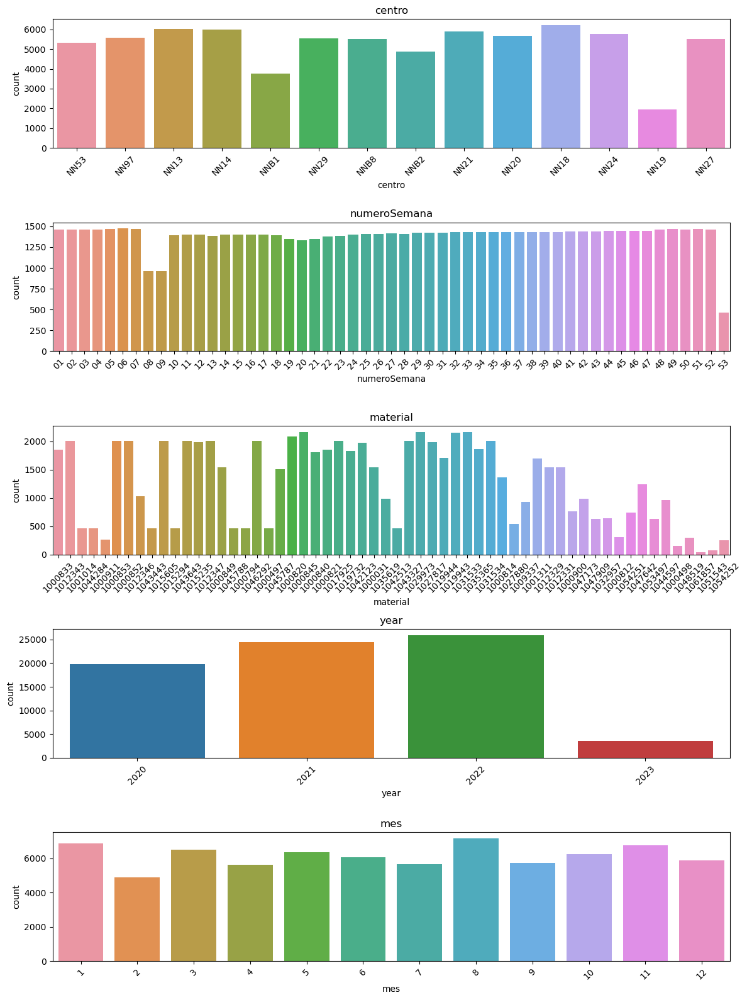

In [53]:
fig, axs = plt.subplots(5, 1, figsize=(12, 16))

for i, col in enumerate(['centro', 'numeroSemana', 'material', 'year','mes']):
    sns.countplot(dfp_3_lineas[col], ax=axs[i])
    axs[i].set_title(col)
    axs[i].tick_params(axis='x', labelrotation=45)
    
plt.tight_layout()
plt.show()

In [54]:
# sns.pairplot(dfs)

In [55]:
# correlation=dfs.corr(method='pearson')
# g=sns.heatmap(correlation,square=True,cbar_kws={"shrink": .5},annot=True,fmt='.2f',cmap="coolwarm")
# g.figure.set_size_inches(20,20)

# plt.show()

In [56]:
dfp_3_lineas.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73613 entries, 44185 to 33550
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   semana            73613 non-null  object        
 1   Codmat            73613 non-null  object        
 2   cant              73613 non-null  float64       
 3   semanacalendario  73613 non-null  object        
 4   Semana Corregida  73613 non-null  datetime64[ns]
 5   centro            73613 non-null  object        
 6   numeroSemana      73613 non-null  object        
 7   Linea             73613 non-null  object        
 8   material          73613 non-null  object        
 9   year              73613 non-null  int64         
 10  mes               73613 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(7)
memory usage: 6.7+ MB


In [57]:
dfp_3_lineas.head()

,semana,Codmat,cant,semanacalendario,Semana Corregida,centro,numeroSemana,Linea,material,year,mes
44185,2021-01-04,NN53-1000833,45.00,2021.01,2021-01-04,NN53,01,Salchicha,1000833,2021,1
50529,2022-01-03,NN97-1012343,2317.00,2022.01,2022-01-03,NN97,01,Salchicha,1012343,2022,1
50477,2021-01-04,NN97-1012343,1480.00,2021.01,2021-01-04,NN97,01,Salchicha,1012343,2021,1
50426,2023-01-02,NN97-1001014,3283.00,2023.01,2023-01-02,NN97,01,Salchicha,1001014,2023,1
5300,2021-01-04,NN13-1044284,34.75,2021.01,2021-01-04,NN13,01,Salchicha,1044284,2021,1


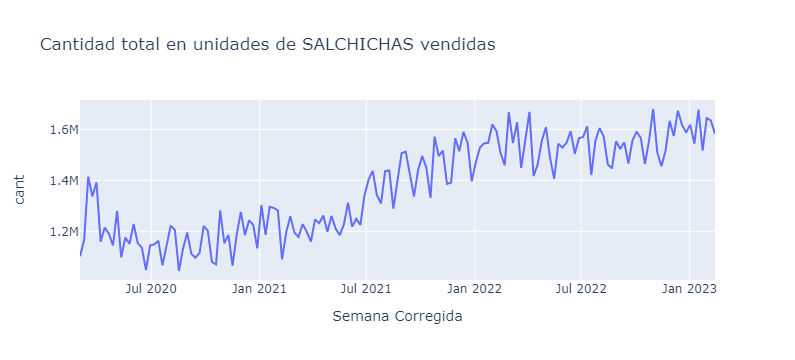

In [58]:
df_plot = dfp_3_lineas[['Semana Corregida', 'cant']].groupby(['Semana Corregida']).sum().reset_index()
fig = px.line(df_plot, x='Semana Corregida', y='cant', title = 'Cantidad total en unidades de SALCHICHAS vendidas')
fig.show()

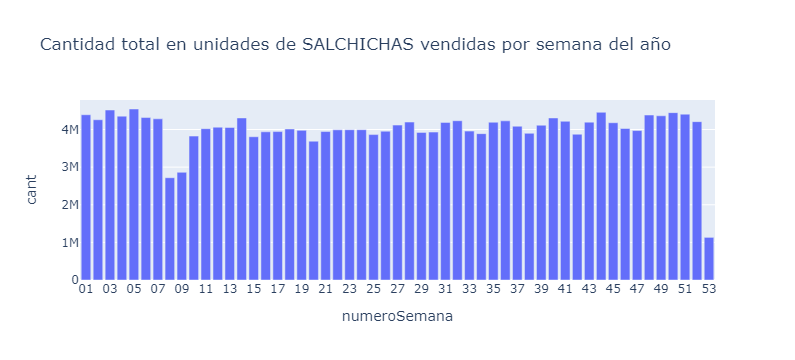

In [59]:
df_plot = dfp_3_lineas[['numeroSemana', 'cant']].groupby(['numeroSemana']).sum().reset_index()
fig = px.bar(df_plot, x='numeroSemana', y='cant', title = 'Cantidad total en unidades de SALCHICHAS vendidas por semana del año')
fig.show()

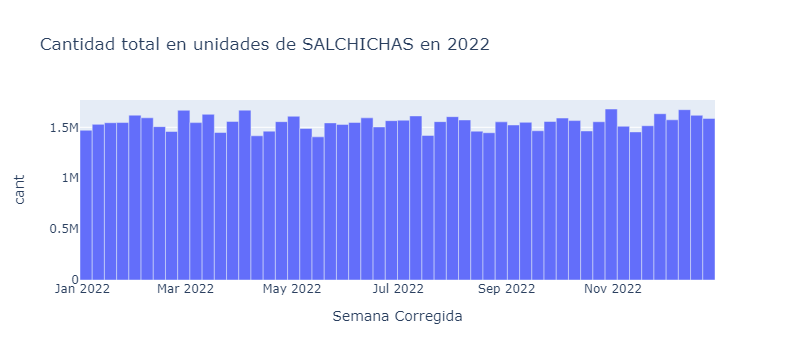

In [60]:
singleYear= 2022

df_cant_singleYear= dfp_3_lineas[dfp_3_lineas.year==singleYear]
df_plot = df_cant_singleYear[['Semana Corregida', 'cant']].groupby(['Semana Corregida']).sum().reset_index()
fig = px.bar(df_plot, x='Semana Corregida', y='cant',facet_col_spacing=0, title = f'Cantidad total en unidades de SALCHICHAS en {singleYear}')
fig.update_layout(bargap=0.0, bargroupgap=0.0)
fig.show()

Centro - Material con mayor movimiento

In [61]:
len(dfp_3_lineas.Codmat.unique())

509

In [62]:
dfp_3_centroMaterial= dfp_3_lineas[['Codmat', 'cant']].groupby(['Codmat']).sum().reset_index().sort_values('cant',ascending =False)
dfp_3_centroMaterial.head(10)

,Codmat,cant
323,NN29-1031533,7656654.912
307,NN29-1000852,7550481.980
16,NN13-1015294,7298460.807
108,NN18-1031533,5962816.840
118,NN18-1046292,5753462.804
231,NN24-1001311,5420601.569
245,NN24-1031533,4688901.881
114,NN18-1043327,4641931.615
104,NN18-1019944,4308245.575
92,NN18-1001311,4298236.027


In [63]:
len(dfp_3_lineas.centro.unique())

14

In [64]:
dfp_3_centro= dfp_3_lineas[['centro', 'cant']].groupby(['centro']).sum().reset_index().sort_values('cant',ascending =False)
dfp_3_centro

,centro,cant
2,NN18,5.864029e+07
8,NN29,3.992229e+07
6,NN24,2.871929e+07
0,NN13,2.196511e+07
5,NN21,1.658036e+07
7,NN27,1.201897e+07
1,NN14,1.025878e+07
4,NN20,7.407056e+06
9,NN53,6.252697e+06
10,NN97,5.735742e+06


In [65]:
len(dfp_3_lineas.material.unique())

58

In [66]:
dfp_3_material= dfp_3_lineas[['material', 'cant']].groupby(['material']).sum().reset_index().sort_values('cant',ascending =False)
# dfp_3_material['cant'] = dfp_3_material['cant'].apply(lambda x: '{:,.0f}'.format(x))
dfp_3_material['cant'] = dfp_3_material['cant'].apply(lambda x: int('{:.0f}'.format(x)))
dfp_3_material

,material,cant
34,1031533,28137219
48,1046292,21454744
17,1001311,17450507
45,1044597,12076983
12,1000852,11520133
25,1015294,10384866
41,1043327,9789760
20,1012331,8316121
35,1031534,8067951
30,1019944,7895189


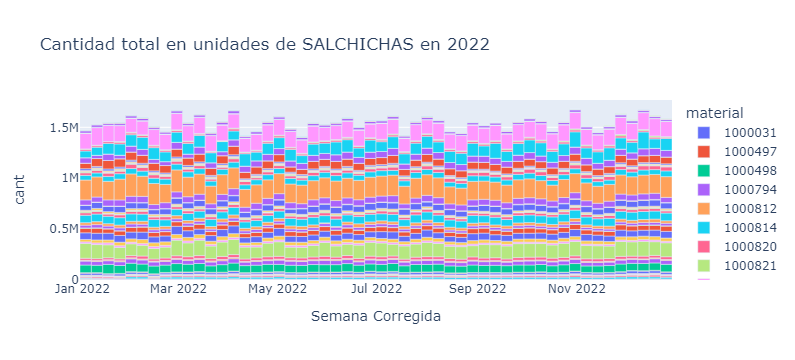

In [67]:
singleYear= 2022

df_cant_singleYear= dfp_3_lineas[dfp_3_lineas.year==singleYear]
df_plot = df_cant_singleYear[['Semana Corregida', 'material','cant']].groupby(['Semana Corregida', 'material']).sum().reset_index()
fig = px.bar(df_plot, x='Semana Corregida', y='cant',color='material', title = f'Cantidad total en unidades de SALCHICHAS en {singleYear}')
fig.update_layout(bargap=0.0, bargroupgap=0.0)
fig.show()

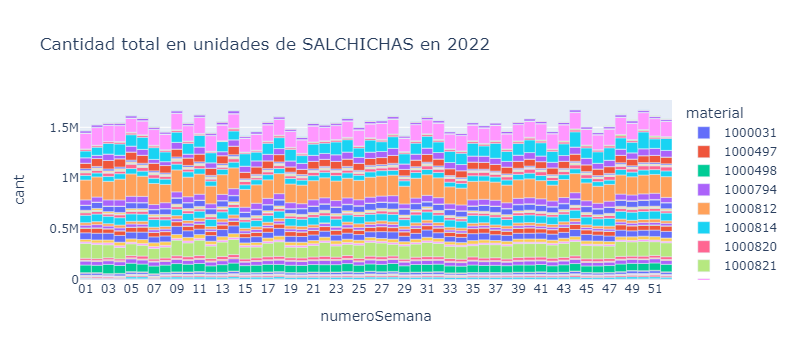

In [68]:
singleYear= 2022

df_cant_singleYear= dfp_3_lineas[dfp_3_lineas.year==singleYear]
df_plot = df_cant_singleYear[['numeroSemana', 'material','cant']].groupby(['numeroSemana', 'material']).sum().reset_index()
fig = px.bar(df_plot, x='numeroSemana', y='cant',color='material', title = f'Cantidad total en unidades de SALCHICHAS en {singleYear}')
fig.update_layout(bargap=0.0, bargroupgap=0.0)
fig.show()

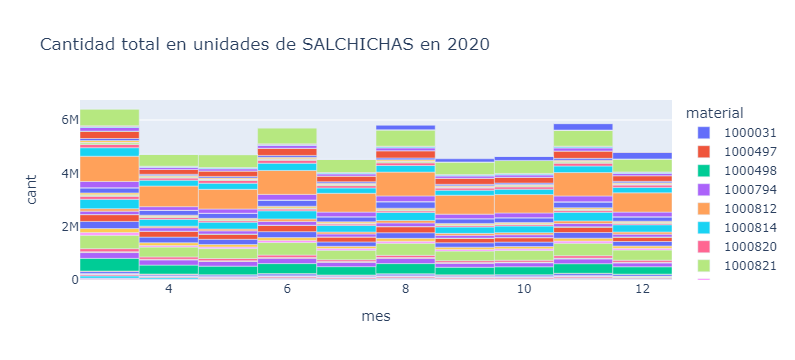

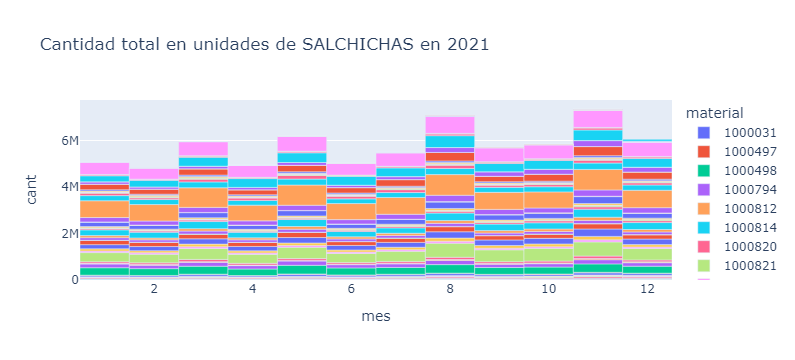

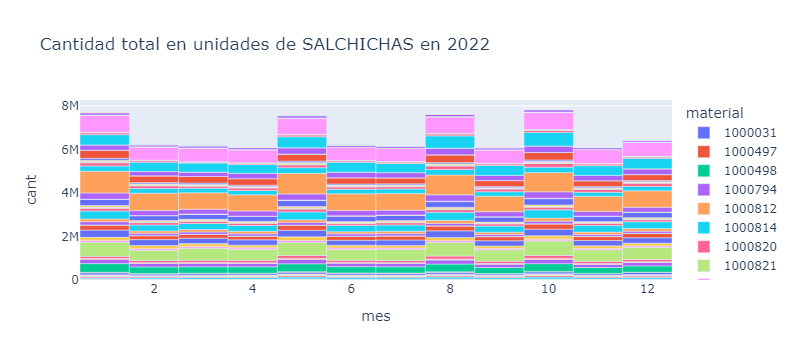

In [69]:
years = [2020, 2021, 2022]  # Lista de años

for singleYear in years:
    df_cant_singleYear = dfp_3_lineas[dfp_3_lineas.year == singleYear]
    df_plot = df_cant_singleYear[['mes', 'material','cant']].groupby(['mes', 'material']).sum().reset_index()
    fig = px.bar(df_plot, x='mes', y='cant',color='material', title = f'Cantidad total en unidades de SALCHICHAS en {singleYear}')
    fig.update_layout(bargap=0.0, bargroupgap=0.0)
    fig.show()

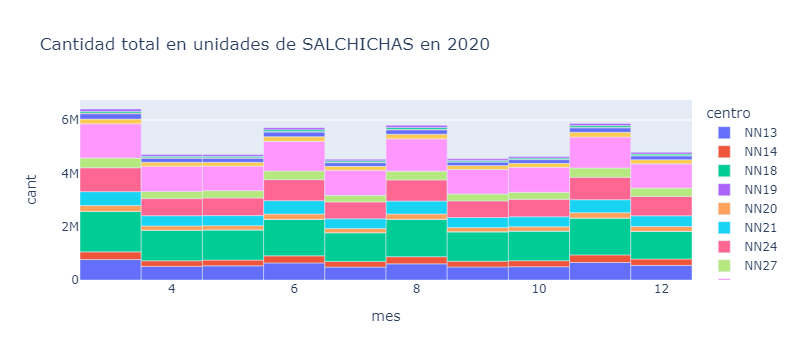

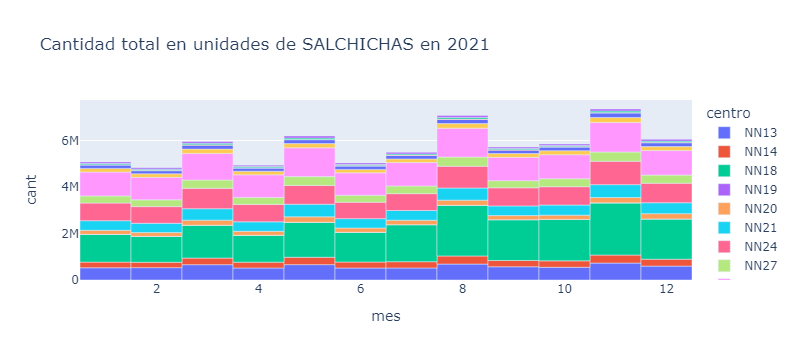

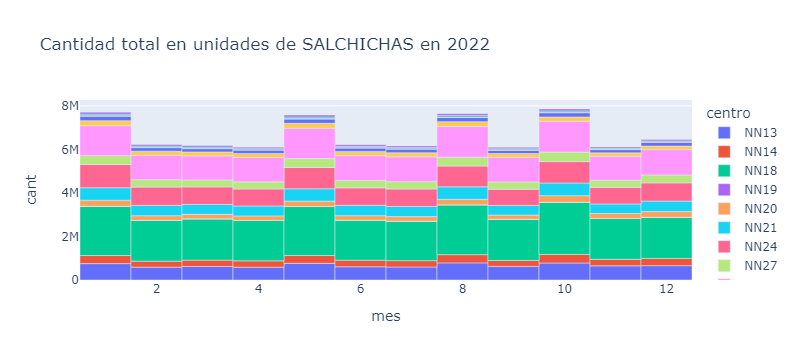

In [70]:
years = [2020, 2021, 2022]  # Lista de años

for singleYear in years:
    df_cant_singleYear = dfp_3_lineas[dfp_3_lineas.year == singleYear]
    df_plot = df_cant_singleYear[['mes', 'centro','cant']].groupby(['mes', 'centro']).sum().reset_index()
    fig = px.bar(df_plot, x='mes', y='cant',color='centro', title = f'Cantidad total en unidades de SALCHICHAS en {singleYear}')
    fig.update_layout(bargap=0.0, bargroupgap=0.0)
    fig.show()

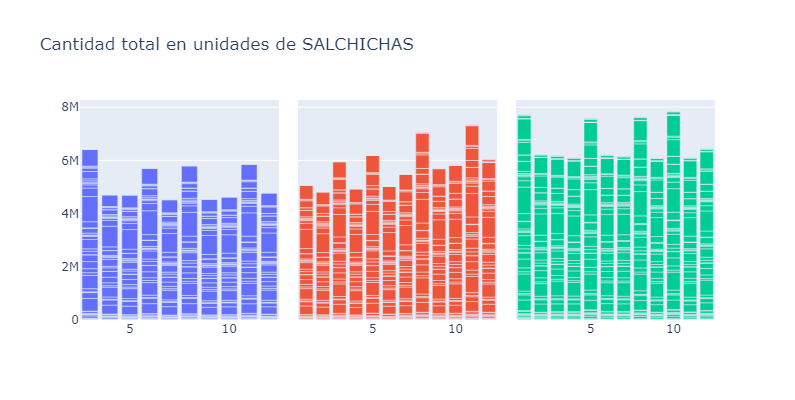

In [71]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

years = [2020, 2021, 2022]  # Lista de años

# Crear la figura de subplots
fig = make_subplots(rows=1, cols=len(years), shared_yaxes=True, horizontal_spacing=0.03)

# Agregar cada gráfico como un sub-trazado en la figura
for i, singleYear in enumerate(years):
    df_cant_singleYear = dfp_3_lineas[dfp_3_lineas.year == singleYear]
    df_plot = df_cant_singleYear[['mes', 'material','cant']].groupby(['mes', 'material']).sum().reset_index()
    fig.add_trace(go.Bar(x=df_plot['mes'], y=df_plot['cant'], name=singleYear), row=1, col=i+1)

# Actualizar el diseño de la figura
fig.update_layout(title='Cantidad total en unidades de SALCHICHAS', height=400, showlegend=False)

# Mostrar la figura
fig.show()
